# Explore data

In [21]:
import scanpy as sc
sc.set_figure_params(frameon=False, dpi=80, fontsize=12)

from scatlastb_utils.io import read_anndata

## Read data

In [22]:
adata_sc = read_anndata(
    'data/pipeline/load_data/download/Retina_scRNA.h5ad',
    dask=True,
    backed=True,
    verbose=False
)
adata_sc

AnnData object with n_obs × n_vars = 265767 × 36398
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'donor_id', 'donor_age', 'self_reported_ethnicity_ontology_term_id', 'donor_cause_of_death', 'donor_living_at_sample_collection', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'sample_source', 'tissue_type', 'suspension_depletion_factors', 'suspension_depleted_cell_types', 'suspension_derivation_process', 'suspension_dissociation_reagent', 'suspension_dissociation_time', 'suspension_enriched_cell_types', 'suspension_enrichment_factors', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'tissue_handling_interval', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'sequencing_platform', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ont

In [23]:
adata_sn = read_anndata(
    'data/pipeline/load_data/download/Retina_snRNA.h5ad',
    dask=True,
    backed=True,
    verbose=False,
)
adata_sn

AnnData object with n_obs × n_vars = 3177310 × 36406
    obs: 'reference_genome', 'gene_annotation_version', 'alignment_software', 'intronic_reads_counted', 'donor_id', 'donor_age', 'self_reported_ethnicity_ontology_term_id', 'donor_cause_of_death', 'donor_living_at_sample_collection', 'sample_id', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_collection_method', 'tissue_source', 'tissue_type', 'suspension_derivation_process', 'suspension_dissociation_reagent', 'suspension_enriched_cell_types', 'suspension_enrichment_factors', 'suspension_uuid', 'suspension_type', 'tissue_handling_interval', 'library_id', 'assay_ontology_term_id', 'sequenced_fragment', 'institute', 'library_id_repository', 'sequencing_platform', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'majorclass', 'AC_subclass', 'AC_cluster', 'AC_celltype_number', 'BC_subclass', 'RGC_cluster', 'RGC_

## snRNA

In [38]:
for ct in adata_sn.obs['majorclass'].unique():
    print(ct)

AC
BC
RGC
Rod
Cone
HC
MG
Astrocyte
Microglia
RPE


In [69]:
adata_sn.obs[['library_id', 'suspension_uuid']].drop_duplicates().value_counts('library_id').max()

np.int64(1)

In [70]:
adata_sn.obs[['library_id', 'suspension_uuid', 'sample_id']].drop_duplicates().value_counts('suspension_uuid').max()

np.int64(1)

In [63]:
adata_sn.obs[['library_id', 'suspension_uuid', 'sample_id']].drop_duplicates().value_counts('sample_id').max()

np.int64(4)

In [62]:
adata_sn.obs[['donor_id', 'sample_id']].drop_duplicates().value_counts('sample_id').max()

np.int64(1)

In [65]:
adata_sn.obs[['donor_id', 'sample_id']].drop_duplicates().value_counts('donor_id').max()

np.int64(9)

In [67]:
adata_sn.obs['donor_id'].unique()

['19-D003', '19-D005', '19-D006', '19-D007', '19-D008', ..., 'pooled [0150-19,0194-19,0978-18]', 'pooled [1017-17,1053-17,1005-17]', 'pooled [Hu0564,Hu1059]', 'pooled [Hu0326,Hu0355]', 'pooled [Hu0869,Hu0887]']
Length: 104
Categories (104, object): ['17D013', '19-D003', '19-D005', '19-D006', ..., 'pooled [Hu0326,Hu0355]', 'pooled [Hu0564,Hu1059]', 'pooled [Hu0869,Hu0887]', 'sanes2022_Hu082219']

## Check obs columns

In [73]:
adata_sc_columns = adata_sc.obs.columns.difference(adata_sn.obs.columns).tolist()
adata_sc_columns

['group2',
 'group3',
 'library_starting_quantity',
 'library_uuid',
 'mapped_reference_annotation',
 'mapped_reference_assembly',
 'reported_diseases',
 'sample_derivation_process',
 'sample_source',
 'sample_uuid',
 'suspension_depleted_cell_types',
 'suspension_depletion_factors',
 'suspension_dissociation_time',
 'suspension_percent_cell_viability']

In [74]:
adata_sn_columns = adata_sn.obs.columns.difference(adata_sc.obs.columns).tolist()
adata_sn_columns

['AC_celltype_number',
 'AC_cluster',
 'AC_subclass',
 'BC_subclass',
 'RGC_celltype_number',
 'RGC_cluster',
 'gene_annotation_version',
 'institute',
 'intronic_reads_counted',
 'library_id',
 'library_id_repository',
 'reference_genome',
 'sample_collection_method',
 'sample_id',
 'sampleid',
 'sequenced_fragment',
 'tissue_source']

In [75]:
common_columns = adata_sn.obs.columns.intersection(adata_sc.obs.columns).tolist()
common_columns

['alignment_software',
 'donor_id',
 'donor_age',
 'self_reported_ethnicity_ontology_term_id',
 'donor_cause_of_death',
 'donor_living_at_sample_collection',
 'sample_preservation_method',
 'tissue_ontology_term_id',
 'development_stage_ontology_term_id',
 'tissue_type',
 'suspension_derivation_process',
 'suspension_dissociation_reagent',
 'suspension_enriched_cell_types',
 'suspension_enrichment_factors',
 'suspension_uuid',
 'suspension_type',
 'tissue_handling_interval',
 'assay_ontology_term_id',
 'sequencing_platform',
 'is_primary_data',
 'cell_type_ontology_term_id',
 'author_cell_type',
 'disease_ontology_term_id',
 'sex_ontology_term_id',
 'majorclass',
 'study_name',
 'nCount_RNA',
 'nFeature_RNA',
 'percent.mt',
 'cell_type',
 'assay',
 'disease',
 'sex',
 'tissue',
 'self_reported_ethnicity',
 'development_stage',
 'observation_joinid']

In [76]:
nan_dict = {
    'unknown': float('nan'),
    'na': float('nan'),
    'nan': float('nan'),
    'NaN': float('nan'),
}
for col in adata_sc.obs.columns:
    adata_sc.obs[col] = adata_sc.obs[col].replace(nan_dict)
for col in adata_sn.obs.columns:
    adata_sn.obs[col] = adata_sn.obs[col].replace(nan_dict)

In [98]:
def filter_column(adata, col, n_max=100, n_min=1):
    if 'ontology' in col:
        return True
    n = adata.obs[col].nunique(dropna=True)
    return n <= n_min or n >= n_max

In [91]:
adata_sn.obs['assay'].value_counts()

assay
10x 3' v3    3177310
Name: count, dtype: int64

In [97]:
adata_sn.obs['author_cell_type'].value_counts()

author_cell_type
Rod       1066056
MG         221612
MG_OFF     200402
MG_ON      151685
FMB        144086
           ...   
HAC90          79
HAC91          74
HAC92          65
HAC93          55
HAC95          39
Name: count, Length: 123, dtype: int64

In [99]:
for col in adata_sn.obs.columns:
    if filter_column(adata_sn, col, n_max=150):
        continue
    print('-', col)

- donor_id
- donor_age
- donor_cause_of_death
- tissue_source
- suspension_derivation_process
- tissue_handling_interval
- institute
- library_id_repository
- sequencing_platform
- is_primary_data
- author_cell_type
- majorclass
- AC_subclass
- AC_cluster
- AC_celltype_number
- BC_subclass
- RGC_cluster
- RGC_celltype_number
- study_name
- cell_type
- sex
- tissue
- self_reported_ethnicity
- development_stage


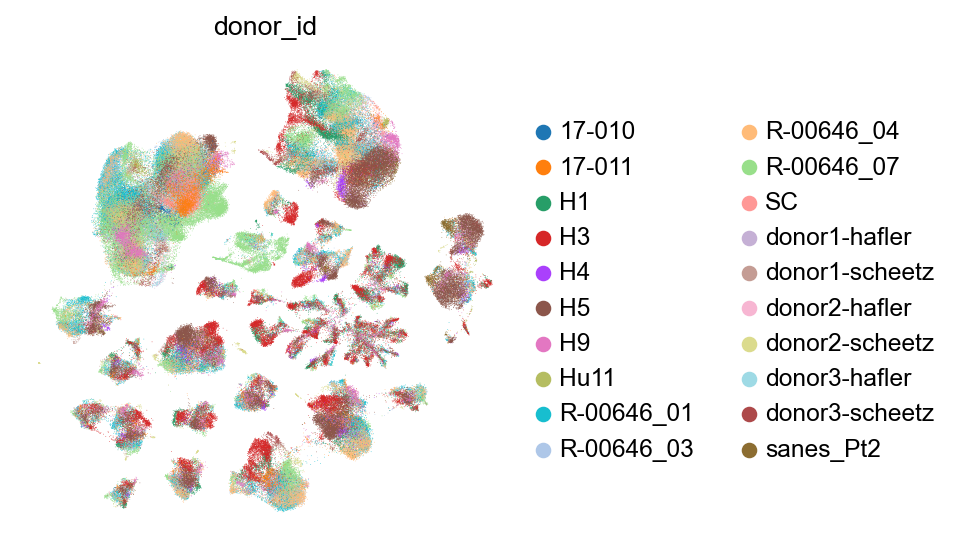

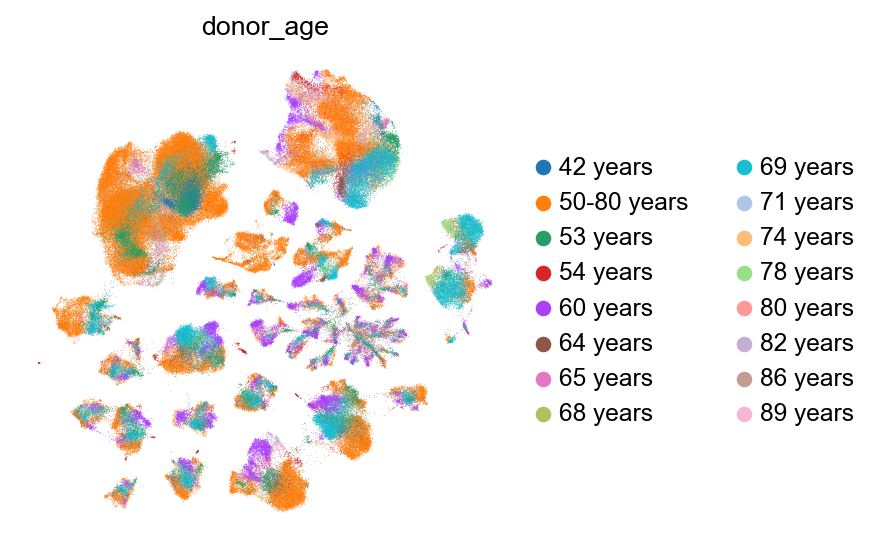

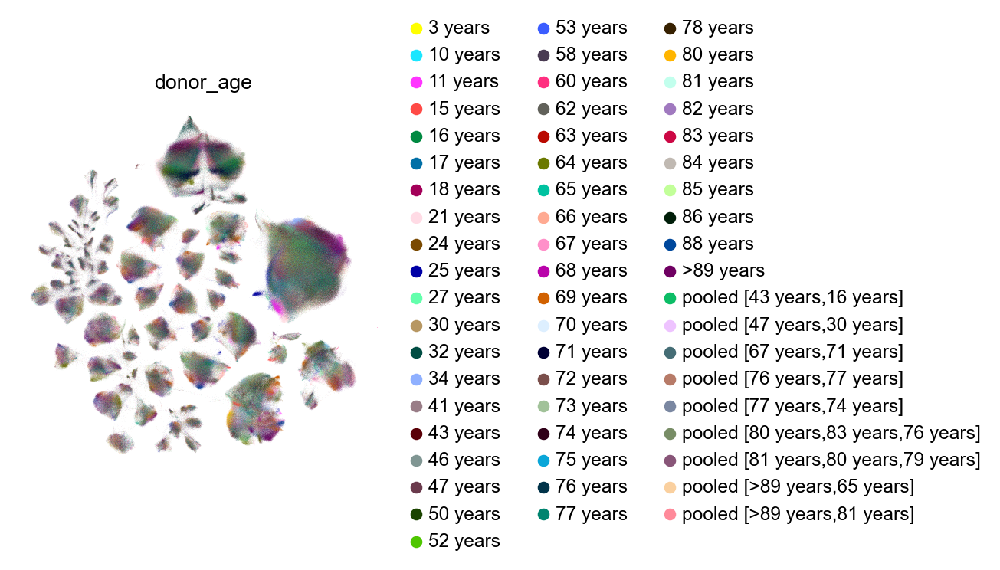

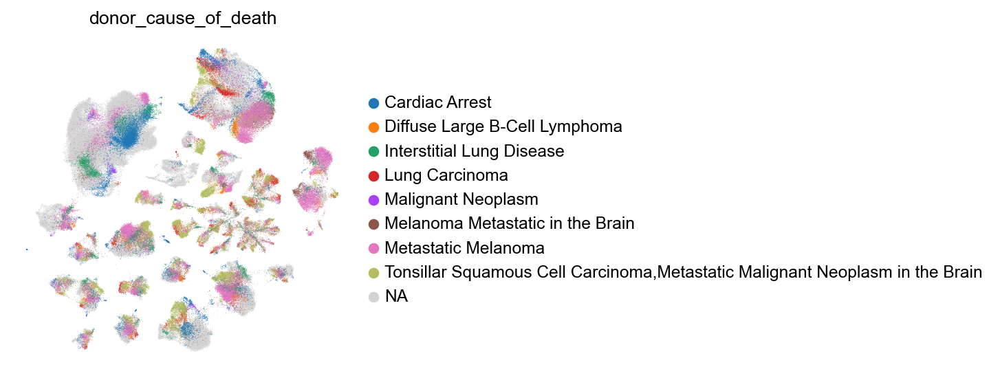

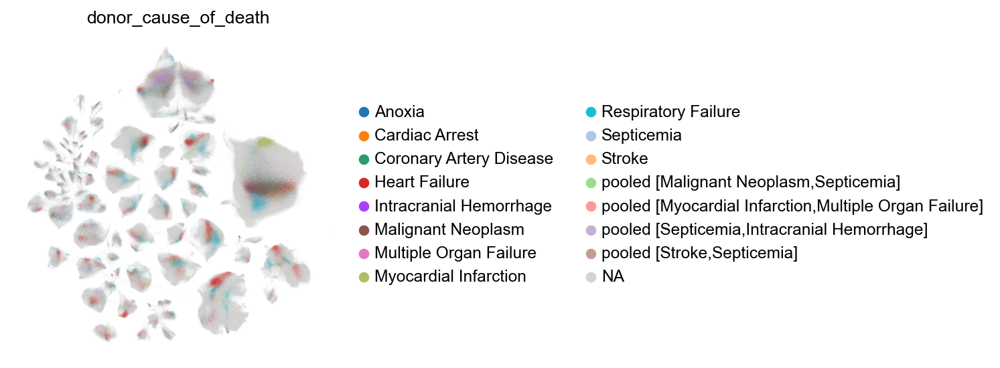

...

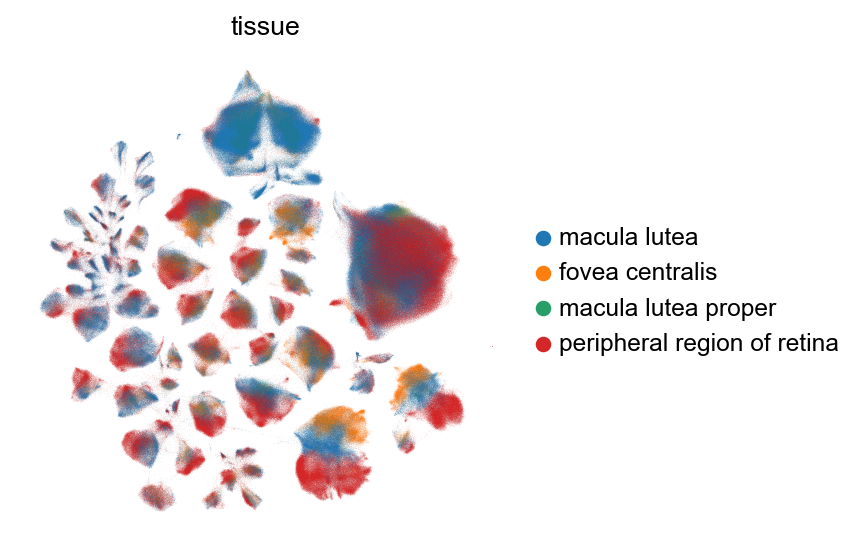

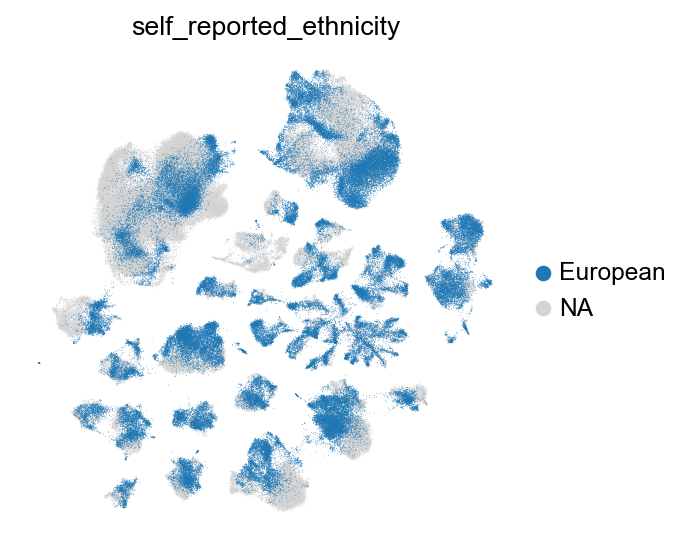

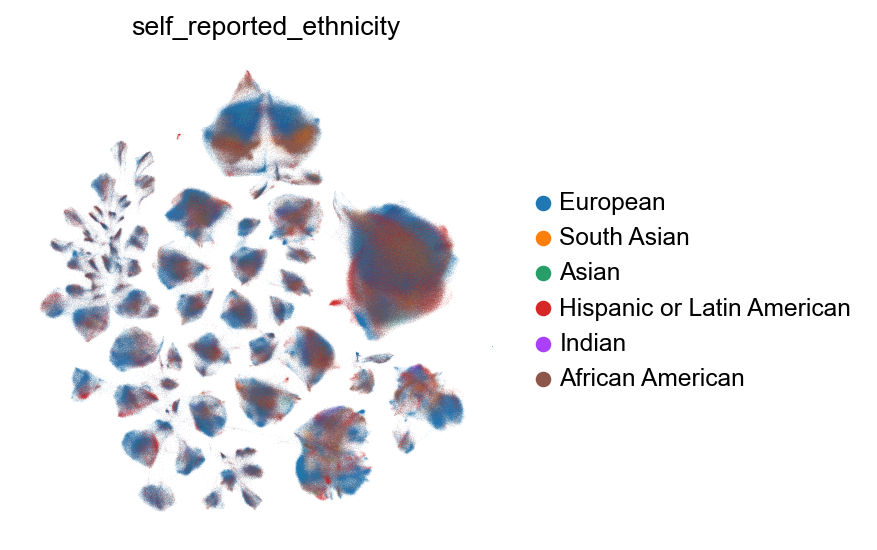

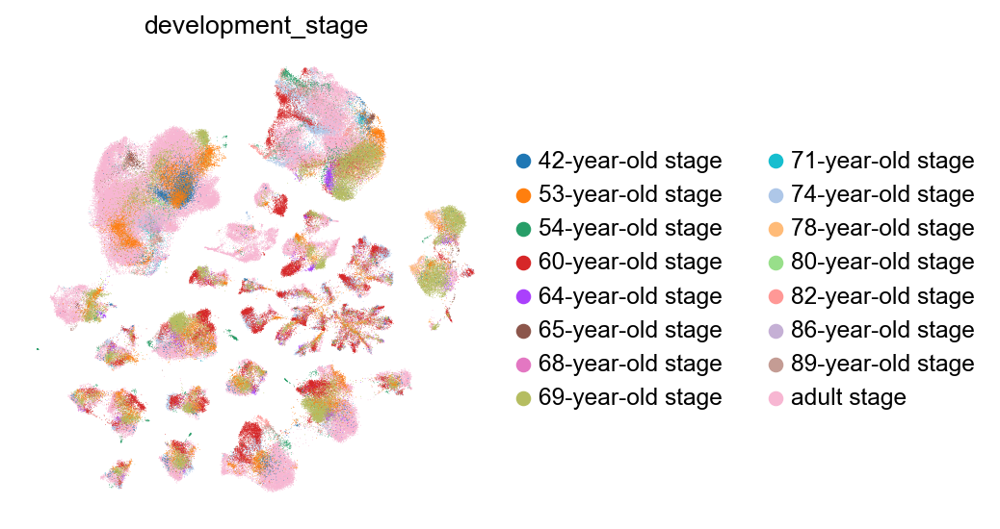

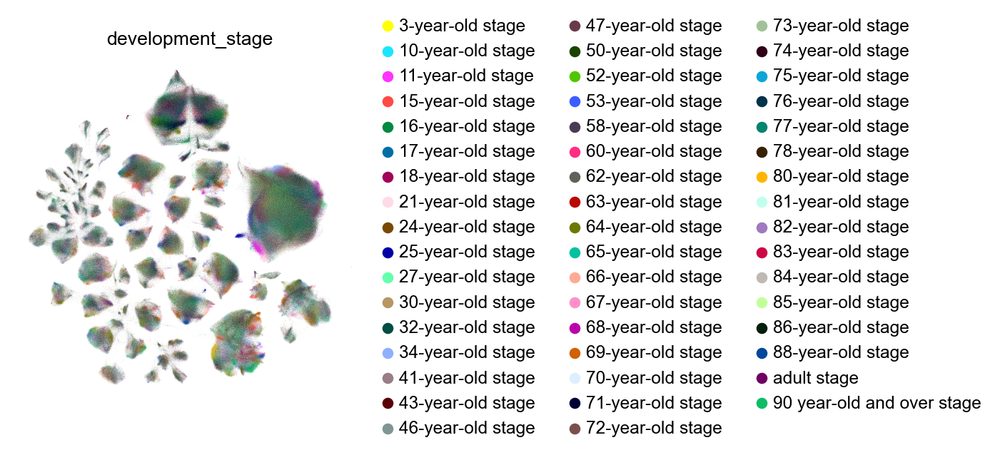

column failed: observation_joinid


Traceback (most recent call last):
  File "/tmp/ipykernel_2184369/949407171.py", line 8, in <module>
    sc.pl.embedding(
  File "/hpc/scratch/project.hca_integration/miniforge3/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py", line 300, in embedding
    order = np.argsort(-color_vector, kind="stable")[::-1]
                       ^^^^^^^^^^^^^
TypeError: bad operand type for unary -: 'str'


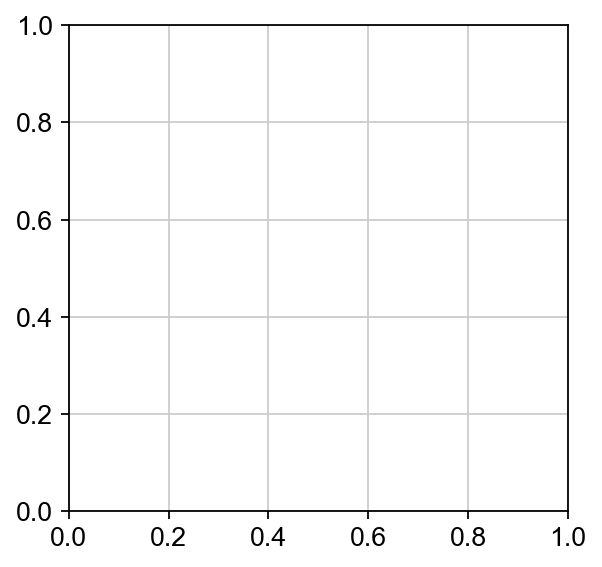

In [40]:
import traceback

for col in common_columns:
    if filter_column(adata_sc, col) and filter_column(adata_sn, col):
        continue
    
    try:
        sc.pl.embedding(
            adata_sc,
            basis='X_umap',
            color=col,
        )

        if adata_sn.obs[col].nunique() > 100:
            continue
        sc.pl.embedding(
            adata_sn,
            basis='X_umap',
            color=col,
        )
    except Exception as e:
        traceback.print_exc()
        print('column failed:', col)

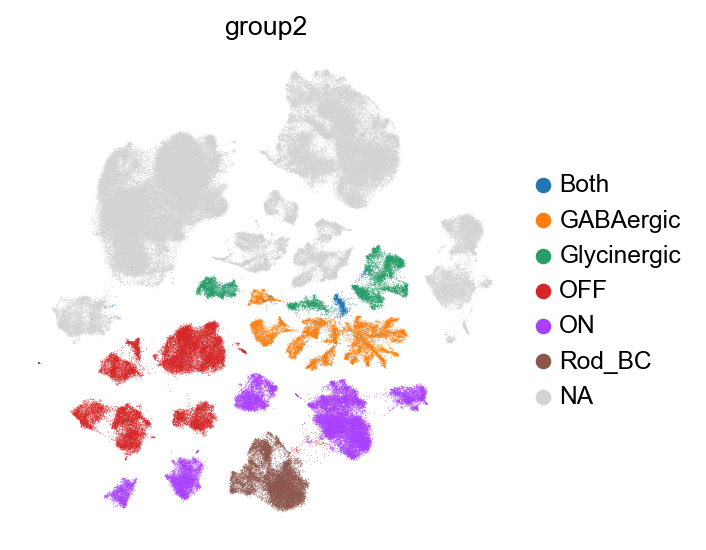

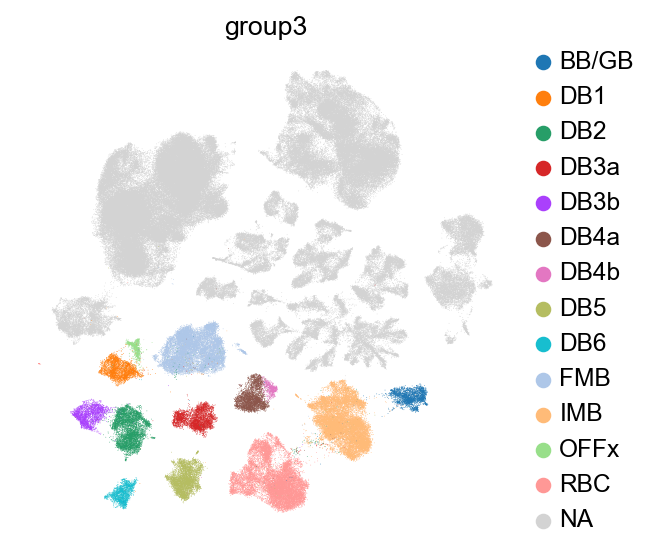

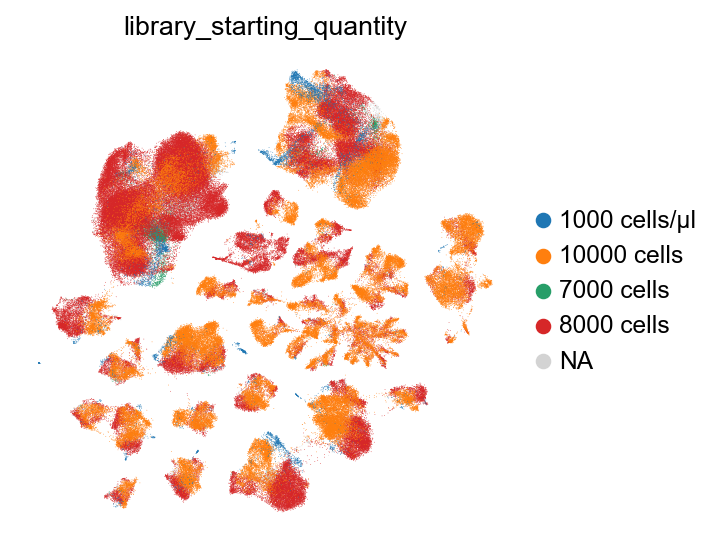

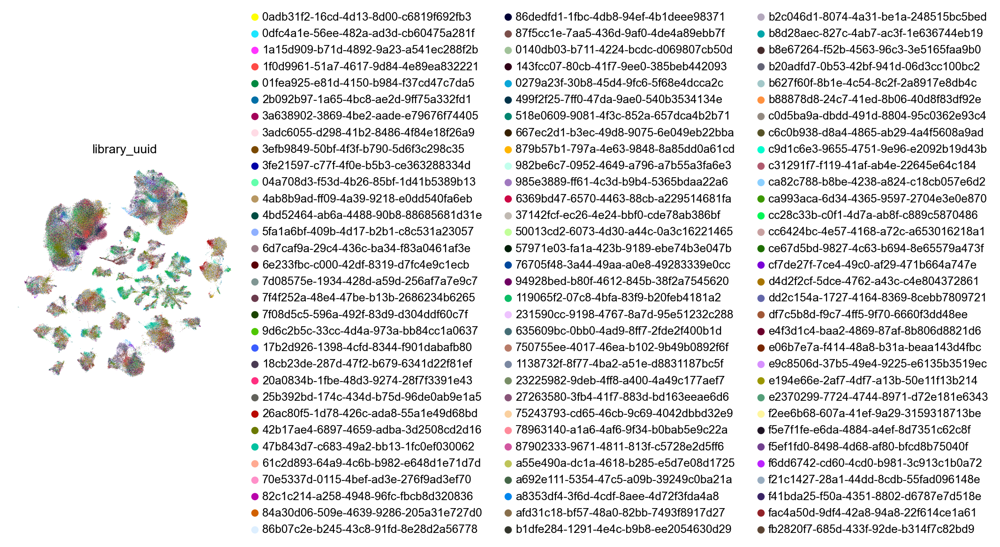

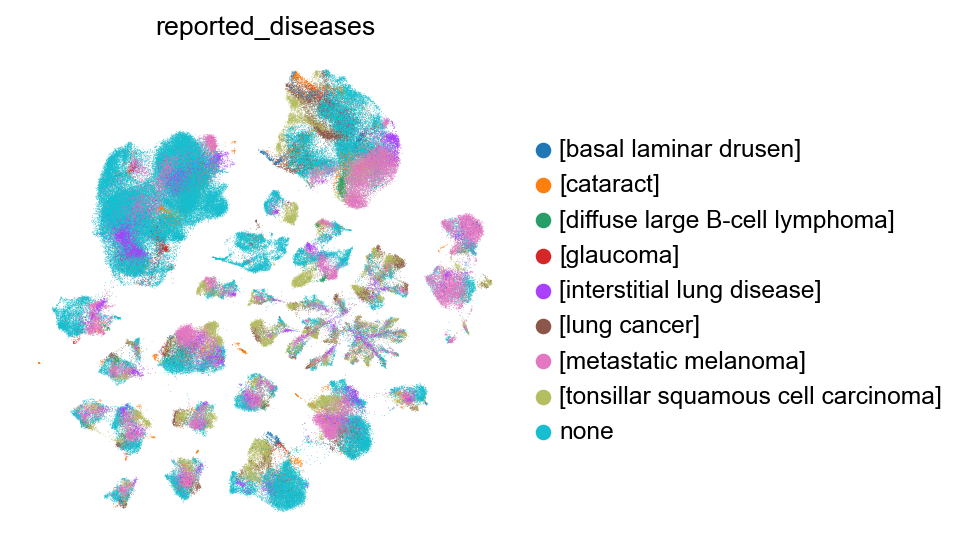

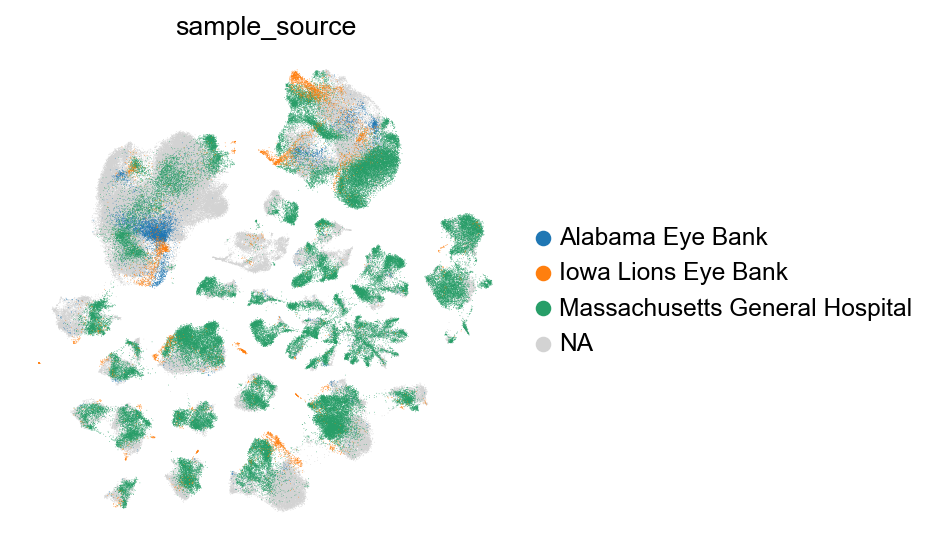

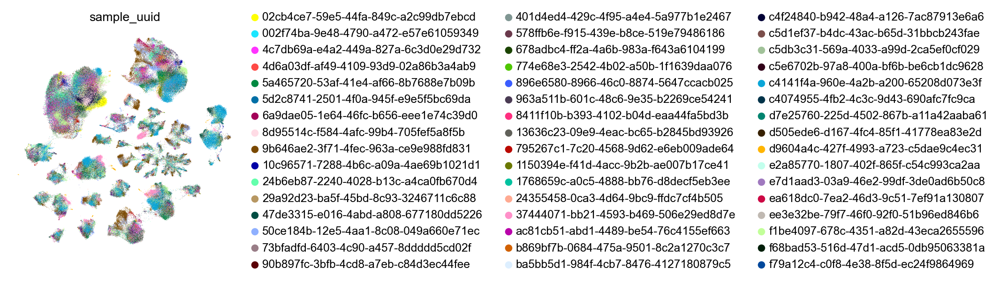

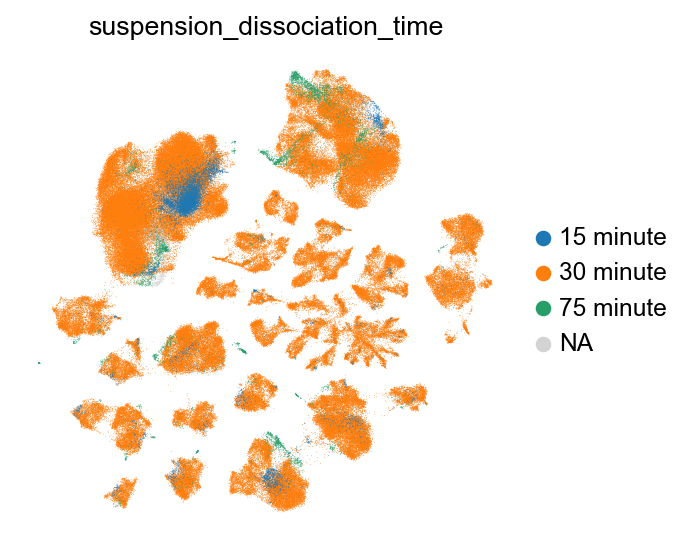

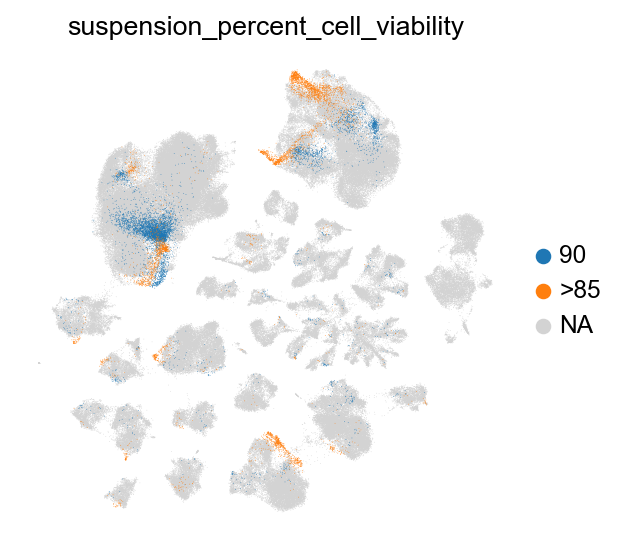

In [48]:
for col in adata_sc_columns:
    if filter_column(adata_sc, col):
        continue
    
    sc.pl.embedding(
        adata_sc,
        basis='X_umap',
        color=col,
    )

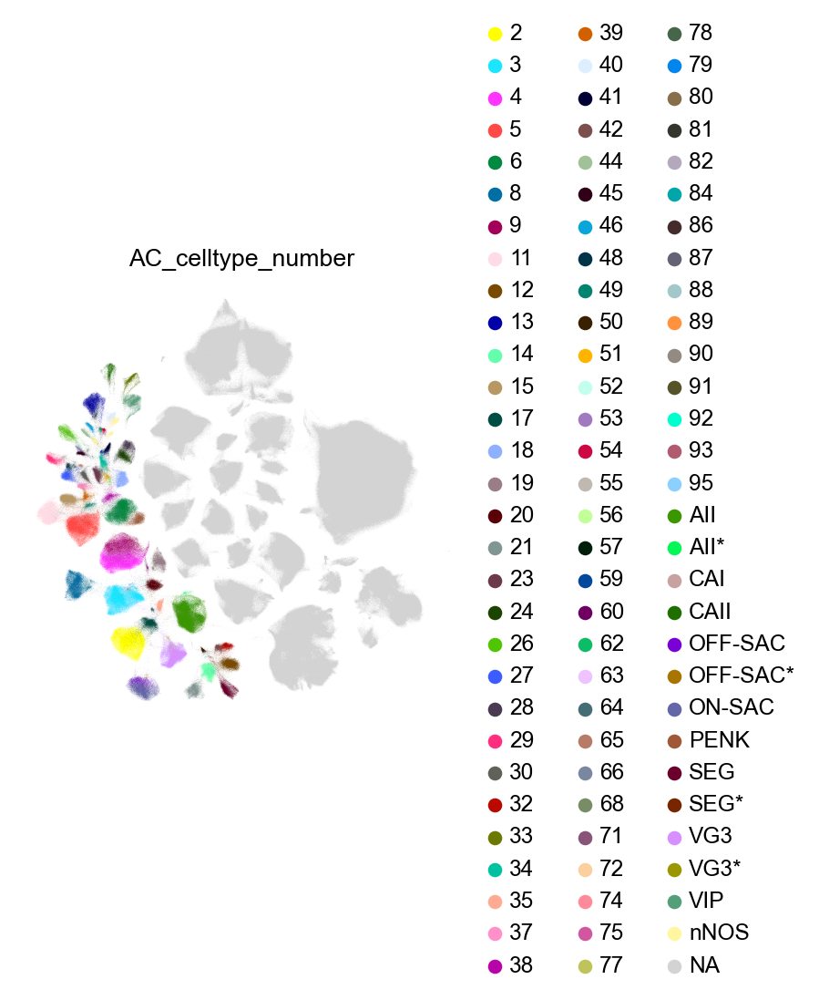

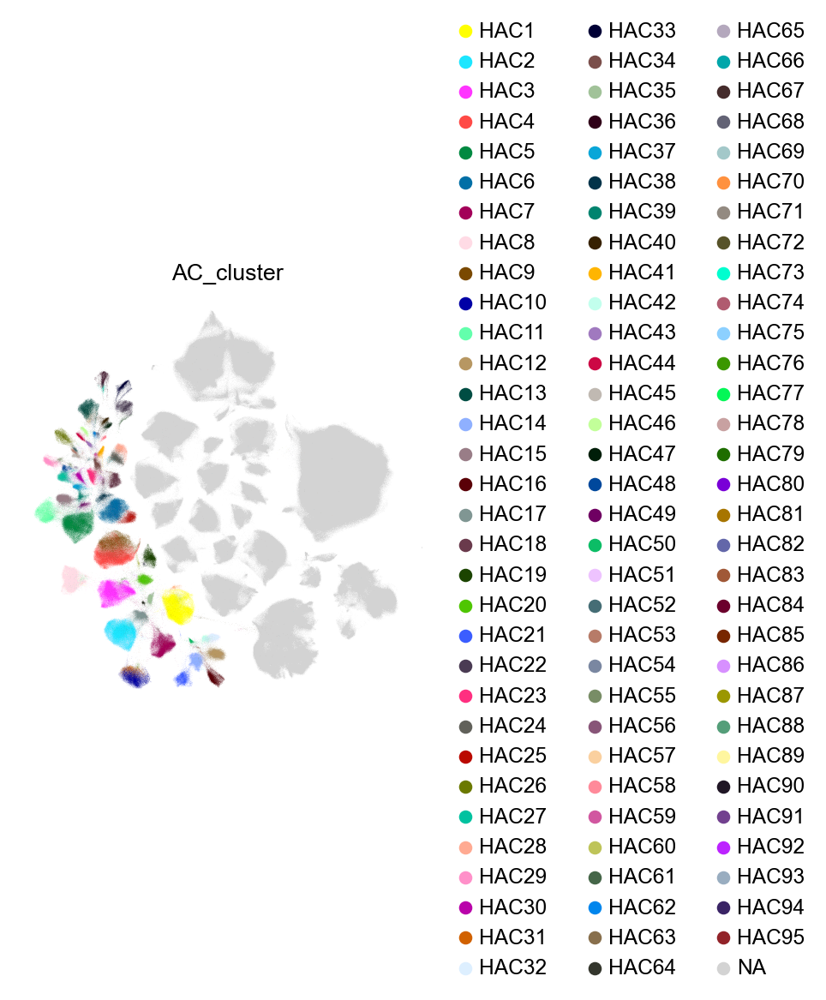

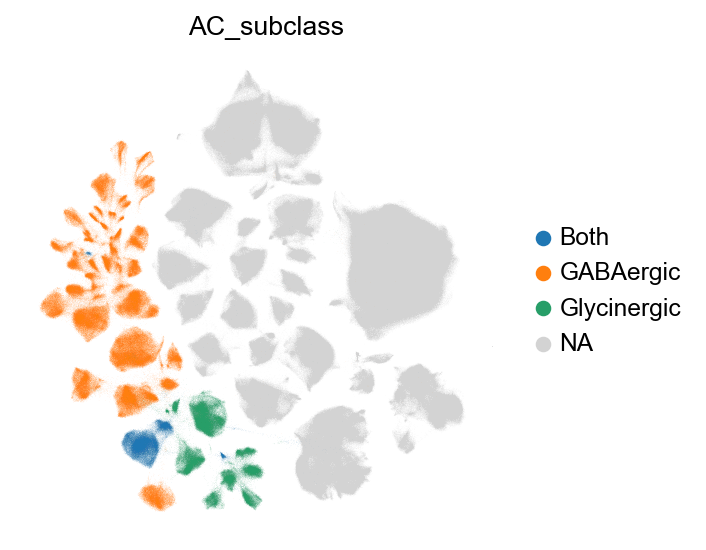

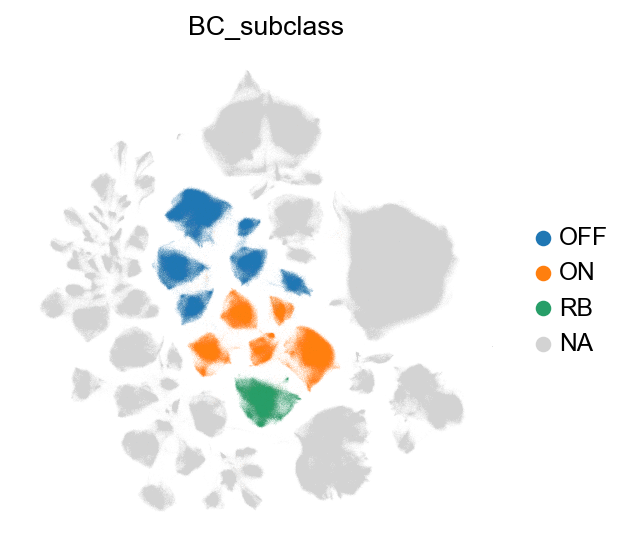

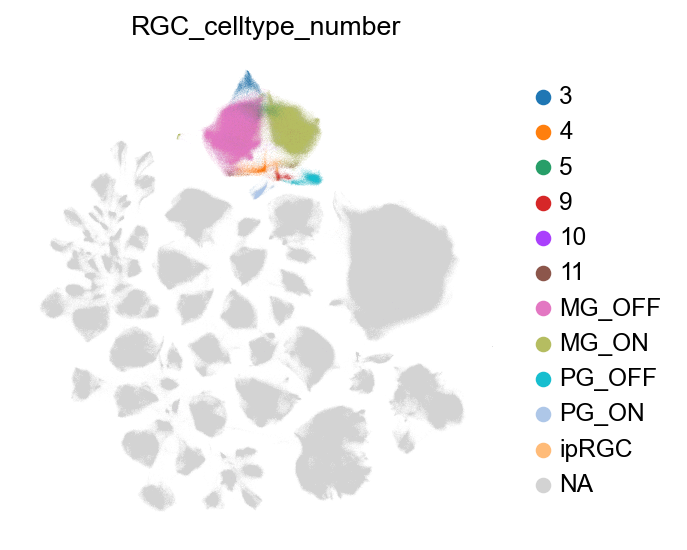

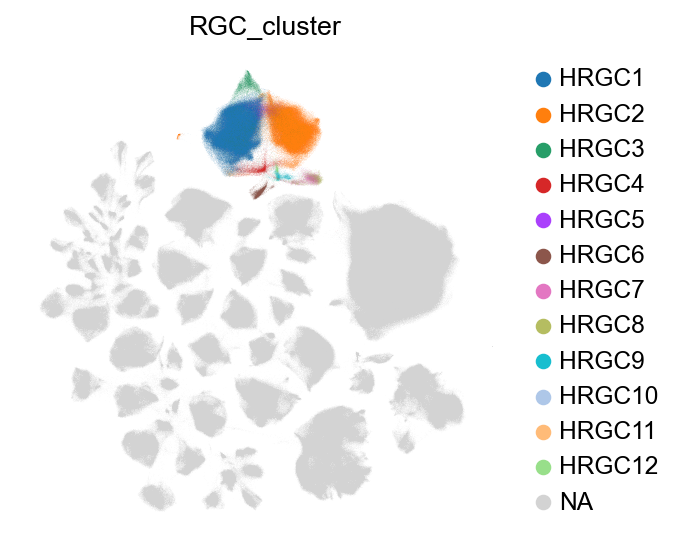

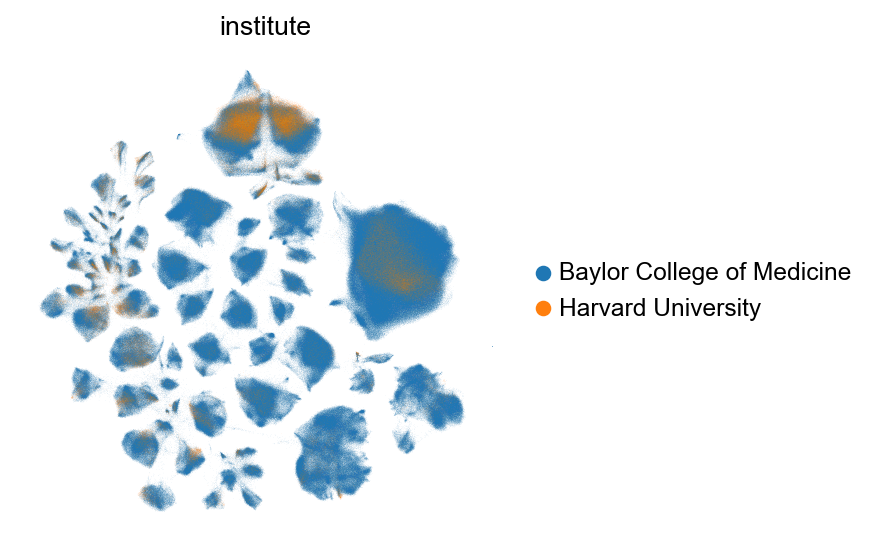

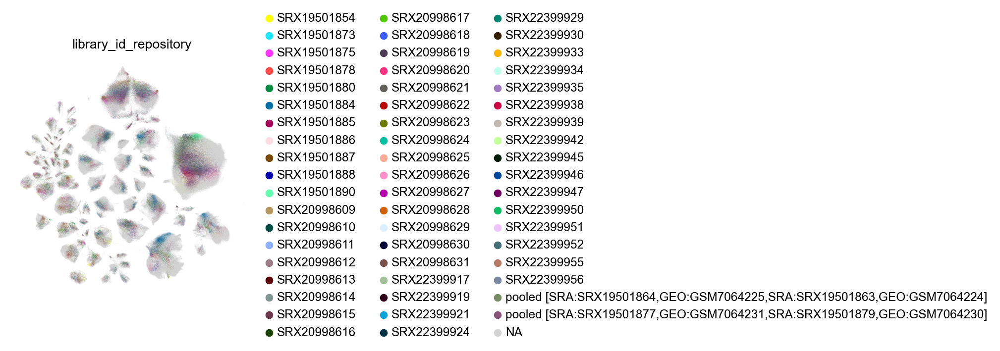

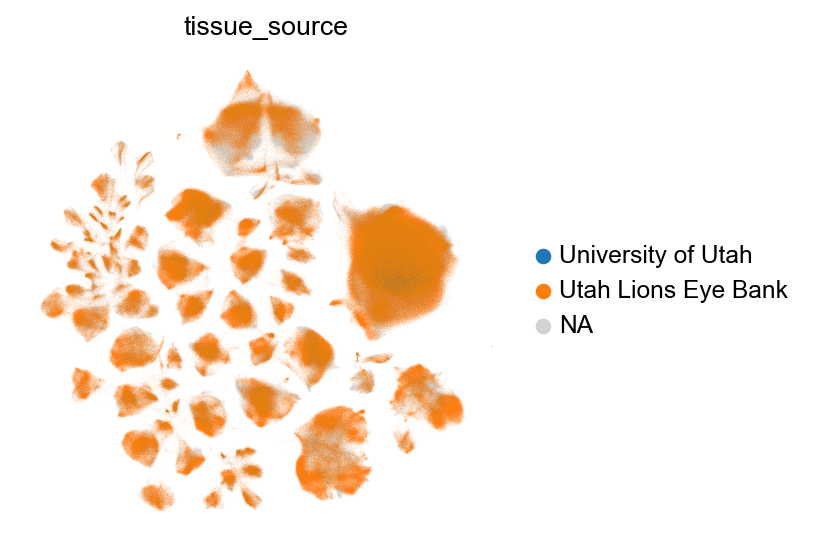

In [49]:
for col in adata_sn_columns:
    if filter_column(adata_sn, col):
        continue
    
    sc.pl.embedding(
        adata_sn,
        basis='X_umap',
        color=col,
    )

In [52]:
adata_sn.raw.X

dask.array<concatenate, shape=(3177310, 36406), dtype=float32, chunksize=(200000, 36406), chunktype=scipy.csr_matrix>